In [ ]:
import os
import numpy as np
from tqdm import tqdm
import math
from matplotlib import pyplot as plt, colors

In [ ]:
import torch
from torch import nn

In [ ]:
import pickle

### Uncomment if running on Google colab

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
wdir = '/content/drive/MyDrive/EECS6412/eecs6412project/'
fdir = wdir + 'interpolated_spectra/intermediate_datasets/'

#### then comment this out if running on Google colab

In [ ]:
wdir = "./"
fdir = ""

### Read data

In [ ]:
dr16qsnr10_dataset_np = np.load(fdir+'dr16qsnr10_dataset_vae_eval.npy')
dr16qsnr10_errterm_np = np.load(fdir+'dr16qsnr10_errterm_vae_eval.npy')

In [ ]:
# the important columns from DR16Q_v4.fits
important_values_pickle_file = open(fdir+'v4fits_important_values_hmap.pkl', 'rb')
important_values = pickle.load(important_values_pickle_file)
important_values_pickle_file.close()

In [ ]:
# indices of the important column in the original file
important_values_idxs  = [1, 2, 4, 26, 54, 55, 56, 57, 59, 61, 63, 90, 95, 96, 97, 158, 160, 162]
important_values_names = ['RA', 'DEC', 'MJD', 'Z', 'NHI_DLA', 'CONF_DLA', 'BAL_PROB', 'BI_CIV', 'AI_CIV', 'BI_SIIV', 'AI_SIIV', 'PLATESN2', 'EXTINCTION', 'M_I', 'SN_MEDIAN_ALL', 'XMM_SOFT_FLUX', 'XMM_HARD_FLUX', 'XMM_TOTAL_FLUX']

#### Normalize the dataset same way as in training code

In [ ]:
# get max norms of each spectrum
norms = np.max(dr16qsnr10_dataset_np, axis=1)[:,None]
# normalize each of the spectra
dr16qsnr10_dataset_np = dr16qsnr10_dataset_np/norms

In [ ]:
dr16qsnr10_errterm_np = dr16qsnr10_errterm_np/norms # normalize all the flux errors
ivar = 1/dr16qsnr10_errterm_np**2 # inverse variance

eps = 1./(2e6) # weight cap
data_weights = ivar/(1 + eps*ivar)

In [ ]:
dr16qsnr10_dataset_np.shape

(21771, 1500)

#### Same train test split as the training code

In [ ]:
spec = dr16qsnr10_dataset_np
weights = data_weights

In [ ]:
# train test split - number in each set
trainfrac = 0.75
ntrain = int(spec.shape[0] * trainfrac)
nvalid = spec.shape[0] - ntrain
# number of feature (number of pixel in each spectrum)
nfeat = spec.shape[1]

In [ ]:
# splitting the dataset
# make validation set deterministic
np.random.seed(645847)
permutation = np.random.permutation(spec.shape[0])

# indices of train set
trainidx = permutation[0:ntrain]
# validation set indices
valididx = permutation[-1-nvalid:-1]
# train and test sets
trainspec = spec[trainidx,:]
validspec = spec[valididx,:]
trainweig = weights[trainidx,:]
validweig = weights[valididx,:]
# np.savez(tag+'/datasplit.npz', trainidx=trainidx, valididx=valididx)

In [ ]:
trainspec.shape

(16328, 1500)

### load best models from each category

In [ ]:
import sys
sys.path
sys.path.append(wdir)

import InfoVAE_2

In [ ]:
models_dir = 'VAE_dr16qsnr10_hypersearch_2024-12-16d'
optimal_model_files = [
    'VAE_3feat_lambd-1.707558_alpha-0.000000_nhidden-256-128.pth',
    'VAE_6feat_lambd-0.156433_alpha-0.000000_nhidden-256-128.pth',
    'VAE_9feat_lambd-8.547600_alpha-0.000000_nhidden-256-128.pth',
    'VAE_12feat_lambd-0.463945_alpha-0.000000_nhidden-256-128.pth',
    'VAE_15feat_lambd-3.016972_alpha-0.000000_nhidden-256-128.pth',
]

In [ ]:
latent_size = [3, 6, 9, 12, 15]
models = []

for m in tqdm(optimal_model_files):
    model = torch.load(os.path.join(wdir+models_dir, m))
    models.append(model)

  0%|          | 0/5 [00:00<?, ?it/s]<ipython-input-18-73861d6443d0>:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(os.path.join(wdir+models_dir, m))
10

In [ ]:
trainspec_torch = torch.from_numpy(trainspec).float()
trainweig_torch = torch.from_numpy(trainweig).float()

### Run reconstruction and evaluate MSE

In [ ]:
traindata_mu = []
traindata_logvar = []
model_recon_mse = []

dataset_mse = []

recon_trainspec = []

x = trainspec_torch

for model in tqdm(models):
    # copy from InfoVAE.loss()
    # calculates MSE with inv err as weights
    recon_x, mu, logvar = model.forward(x)

    recon_x_np = recon_x.detach().numpy()
    mu_np = mu.detach().numpy()
    logvar_np = logvar.detach().numpy()

    MSE = np.sum(0.5 * trainweig * (trainspec - recon_x_np) ** 2, axis=1)
    mse_sum = np.sum(MSE)

    # record the mean, logvar, and reconstructed MSE
    traindata_mu.append(mu_np)
    traindata_logvar.append(logvar_np)
    model_recon_mse.append(MSE)
    dataset_mse.append(mse_sum)
    recon_trainspec.append(recon_x_np)

100%|██████████| 5/5 [00:04<00:00,  1.07it/s]


### Graph 1: latent dim count vs MSE

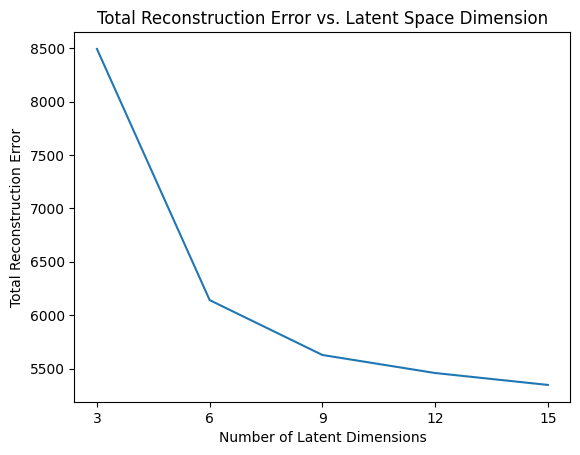

In [ ]:
plt.plot(latent_size, [d/ntrain for d in dataset_mse])
plt.xticks(latent_size)
plt.xlabel("Number of Latent Dimensions")
plt.ylabel("Total Reconstruction Error")
plt.title("Total Reconstruction Error vs. Latent Space Dimension")

plt.show()

### Graph 2: Reconstruction MSE vs Redshift

In [ ]:
dr16q_v4_idxs = {}

for idx, name in tqdm(zip(important_values_idxs, important_values_names)):
    dr16q_v4_idxs[idx] = name

def extract_dr16q_v4_vals(idx):
    return important_values[dr16q_v4_idxs[idx]]

18it [00:00, 92521.41it/s]


### Graph 3: (not used - better versions in Graph 3a)

In [ ]:
redshift_values = extract_dr16q_v4_vals(26)

In [ ]:
len(redshift_values)

16328

In [ ]:
redshift_values_np = np.array(redshift_values) # cosmological redshift values
redshift_values_log = np.log10(redshift_values_np + 1) # cosmological wavelength translation factor (in log space)

In [ ]:
max(redshift_values_np)

6.918659210205078

In [ ]:
num_latents = 9

In [ ]:
# plt.hist(np.sort(redshift_values_log), bins=100, log=True, density=True)
# plt.title("Distribution of Redshifts")
# plt.xlabel(r"$\log_{10}$(z+1)")
# plt.ylabel("Count")

In [ ]:
# log redshift larger than this will be clipped
# for better visual clarity in the corner plot
redshift_log_clipmax = 0.6

### Graph 3a: corner plot of other parameters

##### Code to generate corner plot

In [ ]:
from matplotlib.colors import ListedColormap

In [ ]:
def generate_corner_plot(parameter_array, param_name, clip_min, clip_max, array_mask=None):
    fig, axes = plt.subplots(num_latents,num_latents, figsize=(20,20))
    fig.subplots_adjust(hspace=0, wspace=0)

    do_clip = clip_min != None or clip_max != None

    for i in range(num_latents):
        for j in range(num_latents):
            if i <= j:
                ps = axes[j, i]
                if i == 0: #and j != 0:
                    ps.set_ylabel('$\mu_{%i}$' % (j + 1), fontsize=24, fontweight='bold')
                if j == num_latents - 1:
                    ps.set_xlabel('$\mu_{%i}$' % (i + 1), fontsize=24, fontweight='bold')
                if i != 0:
                    ps.set_yticks([])
                else:
                    # ps.set_yticks([-1,0,1])
                    pass

                if j != num_latents - 1:
                    ps.set_xticks([])
                else:
                    # ps.set_xticks([-1,0,1])
                    pass

                if i < j:
                    # use the mean of each spectrum's latent space values
                    if array_mask is not None:
                        parameter_array_1 = parameter_array[array_mask]
                        c_data = np.clip(parameter_array_1, a_min=clip_min, a_max=clip_max) if do_clip else parameter_array_1

                        im = ps.scatter(
                            traindata_mu[2][array_mask,i],
                            traindata_mu[2][array_mask,j],
                            s=0.49, marker='.',
                            c=c_data,
                            # cmap=cmapclass
                        )
                    else:
                        c_data = np.clip(parameter_array, a_min=clip_min, a_max=clip_max) if do_clip else parameter_array

                        im = ps.scatter(
                            traindata_mu[2][:,i],
                            traindata_mu[2][:,j],
                            s=0.49, marker='.',
                            c=c_data,
                            #cmap=plt.cm.jet
                        )
                elif i == j:
                    # if array_mask is not None:
                    #     histdata = traindata_mu[2][array_mask,i]
                    # else:
                    #     histdata = traindata_mu[2][:,i]

                    # use the entire dataset without cut
                    histdata = traindata_mu[2][:,i]
                    ps.hist(histdata, bins=50, log=False, density=True)
                    ps.tick_params(left=False)
            else:
                ps = axes[j, i]
                ps.axis('off')

    ps = axes[1, 2]
    if clip_min != None and clip_max != None:
        clip_str = f"\nclipped at [{clip_min}, {clip_max}]"
    elif clip_min != None:
        clip_str = f"\nmin clipped at {clip_min}"
    elif clip_max != None:
        clip_str = f"\nmax clipped at {clip_max}"
    else:
        clip_str = ""
    cbar = fig.colorbar(im, ax=ps, anchor=(0.0, 0.5), shrink=5.0, fraction=0.7, location='top')
    cbar.set_label(label=param_name + clip_str, size='x-large', weight='bold')
    cbar.ax.tick_params(axis="both", labelsize=21)
    fig.suptitle("Latent Space Colouring by "+param_name, fontsize=36, fontweight='bold')
    # plt.savefig('figures/cornerplot.png')
    plt.show()

In [ ]:
def generate_hist(val_array, val_name, array_mask=None, mode='lin', bins=50, use_log_scale=False):
  if array_mask is not None:
    val_array_1 = val_array[array_mask]
  else:
    val_array_1 = val_array

  if mode == 'log':
    val_array_1 = np.log10(val_array_1)
  elif mode == 'log1':
    val_array_1 = np.log1p(val_array_1) / np.log(10)

  plt.hist(val_array_1, bins=bins, log=use_log_scale, density=True)

  addstr = ""
  # if mode == 'log':
  #   addstr = 'log of '
  # elif mode == 'log1':
  #   addstr = 'log(1+x) of '

  plt.title("Distribution of " + addstr + val_name, fontsize=18, fontweight='bold')
  plt.xlabel(addstr + val_name, fontsize=18, fontweight='bold')
  plt.ylabel("Counts", fontsize=18, fontweight='bold')
  plt.show()

In [ ]:
def generate_dens(val_array, val_name, array_mask=None, mode='lin', bins=100, lims=(None, None)):
  if array_mask is not None:
    val_array_1 = val_array[array_mask]
    recon_array = model_recon_mse[2][array_mask]
  else:
    val_array_1 = val_array
    recon_array = model_recon_mse[2]

  if mode == 'log':
    val_array_1 = np.log10(val_array_1)
  elif mode == 'log1':
    val_array_1 = np.log1p(val_array_1) / np.log(10)

  # if lims[0] is not None or lims[1] is not None:
  #   val_array_1 = np.clip(val_array_1,lims[0],lims[1])
  if lims[0] is not None and lims[1] is not None:
    new_mask = (val_array_1 >= lims[0]) & (val_array_1 <= lims[1])
    val_array_1 = val_array_1[new_mask]
    recon_array = recon_array[new_mask]
  elif lims[1] is not None:
    new_mask = (val_array_1 <= lims[1])
    val_array_1 = val_array_1[new_mask]
    recon_array = recon_array[new_mask]
  elif lims[0] is not None:
    new_mask = (val_array_1 >= lims[0])
    val_array_1 = val_array_1[new_mask]
    recon_array = recon_array[new_mask]


  lim_str = ""
  if lims[0] is not None and lims[1] is not None:
    lim_str = f"\nclipped at [{lims[0]} , {lims[1]}]"
  elif lims[1] is not None:
    lim_str = f"\nmax clipped at {lims[1]}"
  elif lims[0] is not None:
    lim_str = f"\nmin clipped at {lims[1]}"

  fig, ax = plt.subplots()
  hh = ax.hist2d(val_array_1, np.log10(recon_array), bins=(bins,bins), cmap=plt.cm.jet, norm=colors.LogNorm())
  cbar = fig.colorbar(hh[3], ax=ax)
  cbar.set_label('Density (Normalized to Minimum)', size='large', weight='bold')
  # plt.show()
  # plt.hist2d(np.log(redshift_values_np), np.log(model_recon_mse[2]), bins=(100,100), cmap=plt.cm.jet)

  addstr = ""
  # if mode == 'log':
  #   addstr = 'log of '
  # elif mode == 'log1':
  #   addstr = 'log(1+x) of '
  plt.xlabel(addstr + val_name, fontsize=18, fontweight='bold')
  plt.ylabel(r"$\log_{10}\chi^2$", fontsize=18, fontweight='bold')
  # if lims[0] is not None or lims[1] is not None:
  #   plt.xlim(lims[0],lims[1])
  plt.title(f"Reconstruction Error vs. {val_name}" + lim_str, fontsize=18, fontweight='bold')

  plt.show()

##### Redshift

In [ ]:
redshift_values = extract_dr16q_v4_vals(26)


In [ ]:
#generate_hist(redshift_values, "Z", array_mask=None, mode='lin', bins=100, use_log_scale=True)

In [ ]:
#generate_dens(redshift_values, "Z", array_mask=None, mode='lin', bins=100, lims=(None, None))

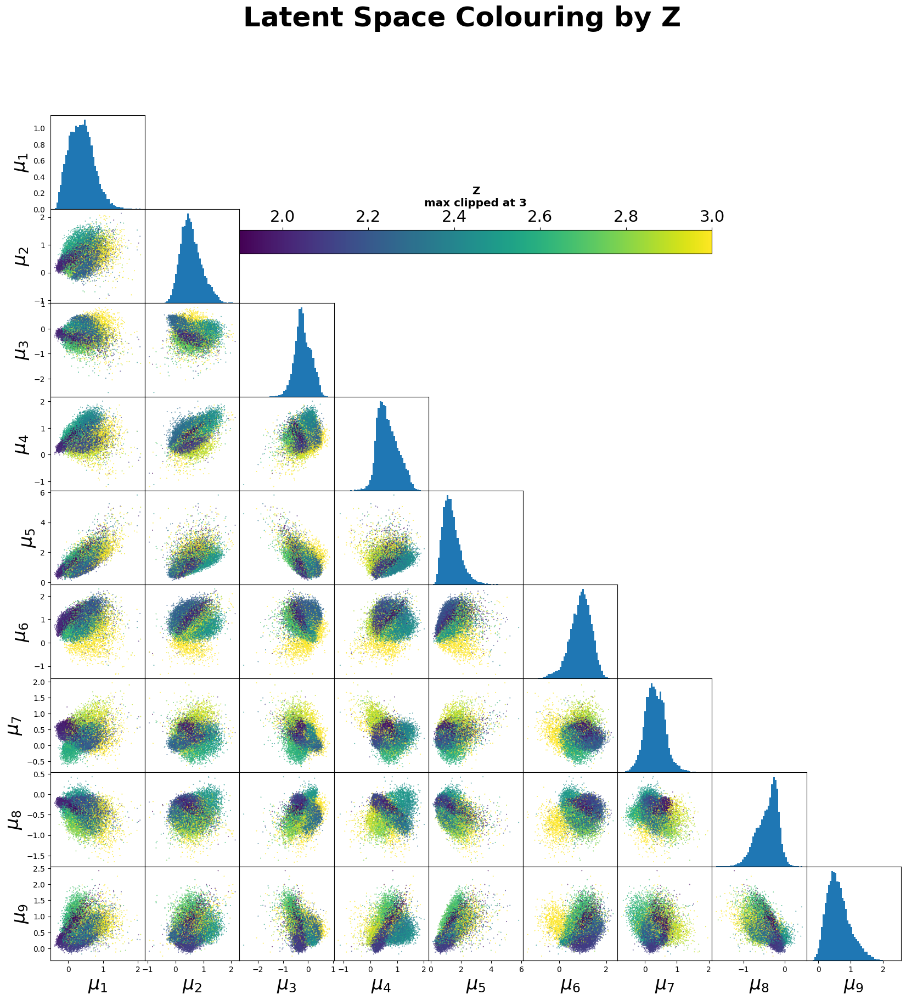

In [ ]:
generate_corner_plot(redshift_values, "Z", clip_min=None, clip_max=3)

##### BAL probability

In [ ]:
bal_prob_values = extract_dr16q_v4_vals(56)

In [ ]:
#generate_hist(bal_prob_values, "BAL_PROB", array_mask=None, mode='lin', bins=100, use_log_scale=True)


In [ ]:
#generate_dens(bal_prob_values, "BAL_PROB", array_mask=None, mode='lin', bins=100, lims=(None, None))


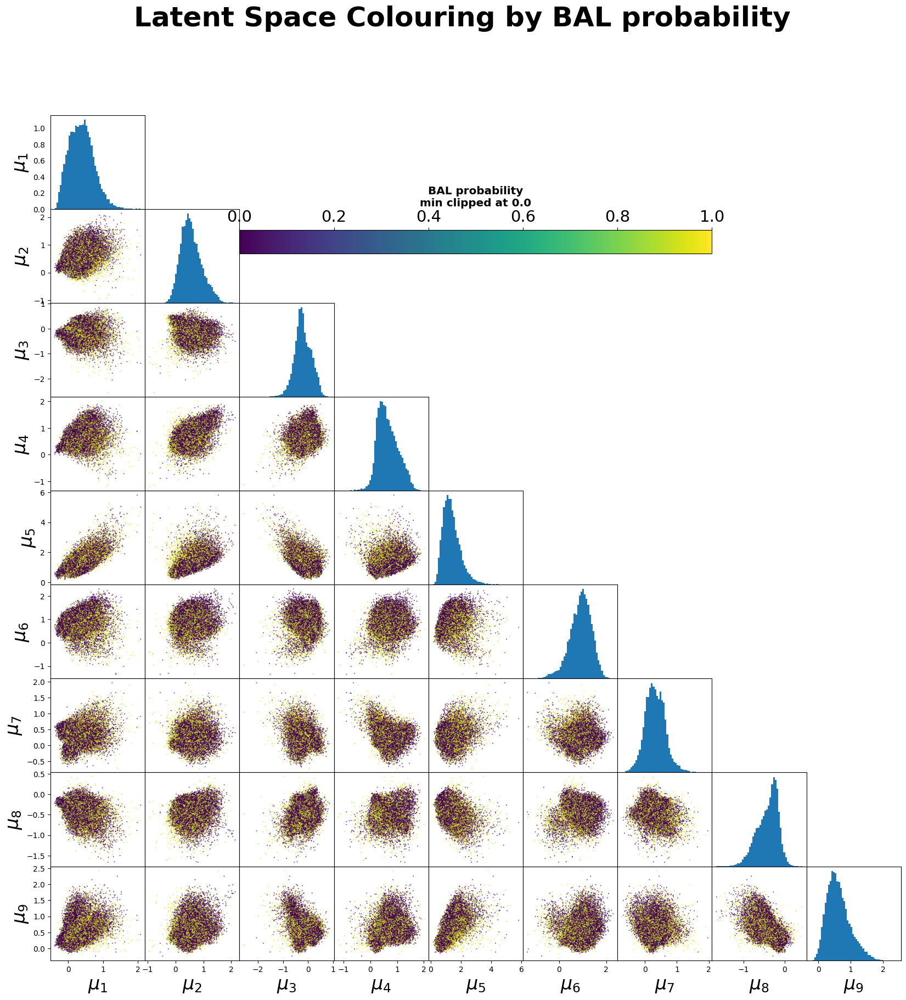

In [ ]:
generate_corner_plot(bal_prob_values, "BAL probability", clip_min=0.0, clip_max=None)

##### (S/N)^2 measure for plate

In [ ]:
PLATESN2_values = extract_dr16q_v4_vals(90)


In [ ]:
#generate_hist(PLATESN2_values, "PLATESN2", array_mask=None, mode='lin', use_log_scale=True)

In [ ]:
#generate_dens(PLATESN2_values, "PLATESN2", array_mask=None, mode='lin', bins=100, lims=(None, 25))

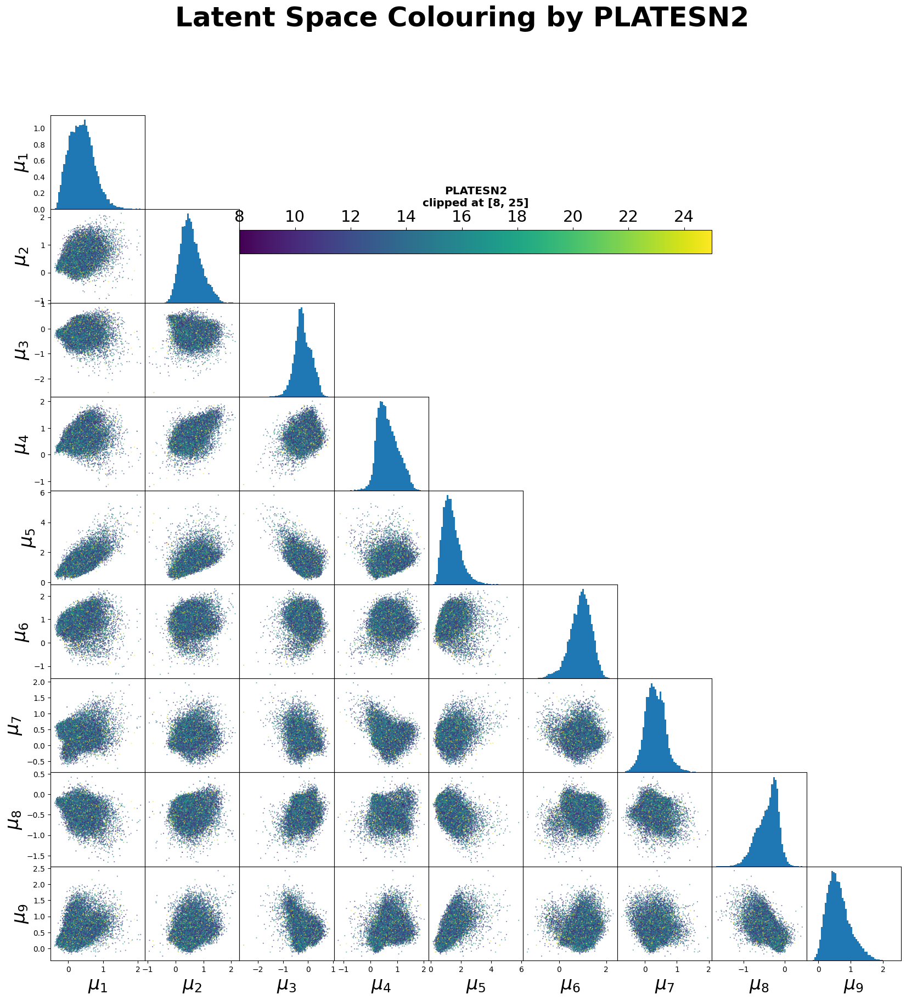

In [ ]:
generate_corner_plot(PLATESN2_values, "PLATESN2", clip_min=8, clip_max=25)

##### SN median

In [ ]:
SN_MEDIAN_ALL_values = extract_dr16q_v4_vals(97)

In [ ]:
#generate_hist(SN_MEDIAN_ALL_values, "SN_MEDIAN_ALL", array_mask=None, mode='lin', use_log_scale=True)

In [ ]:
#generate_dens(SN_MEDIAN_ALL_values, "SN_MEDIAN_ALL", array_mask=None, mode='lin', bins=100, lims=(None, 25))

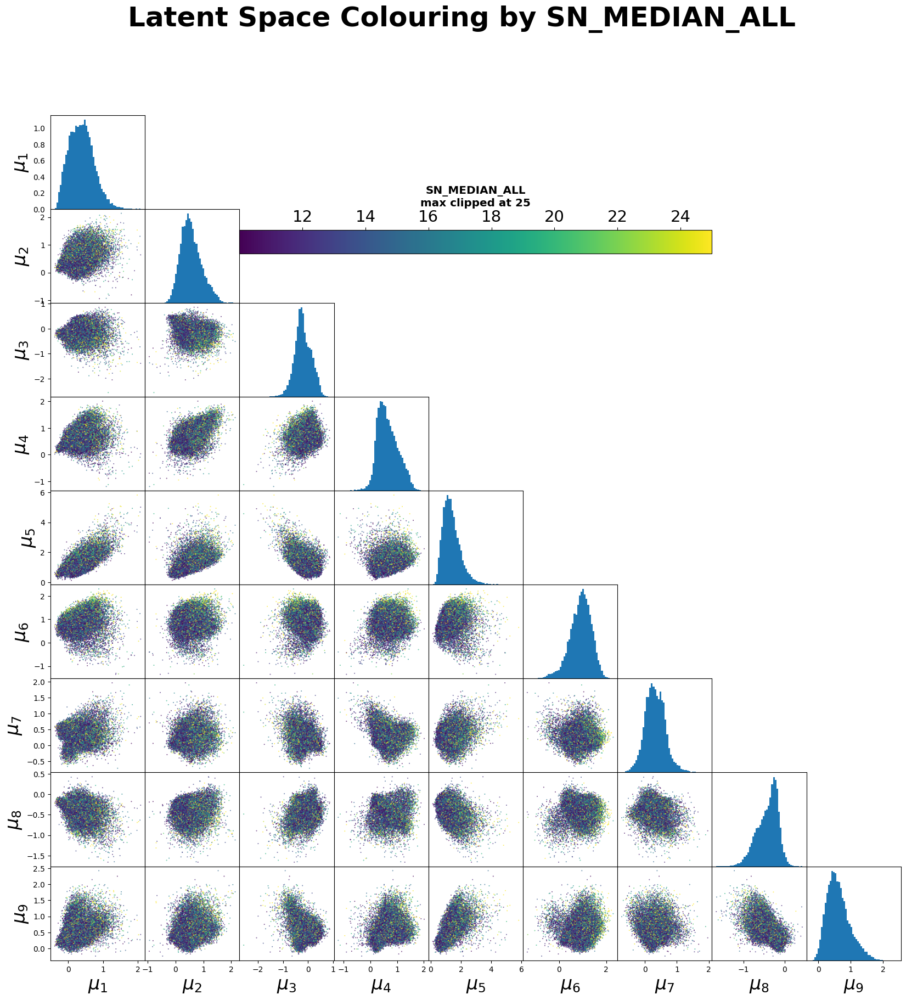

In [ ]:
generate_corner_plot(SN_MEDIAN_ALL_values, "SN_MEDIAN_ALL", clip_min=None, clip_max=25)


##### date and sky position

In [ ]:
MJD_values = extract_dr16q_v4_vals(4)

In [ ]:
#generate_hist(MJD_values, "MJD", array_mask=None, mode='lin', use_log_scale=True)


In [ ]:
#generate_dens(MJD_values, "MJD", array_mask=None, mode='lin', bins=100, lims=(None, None))


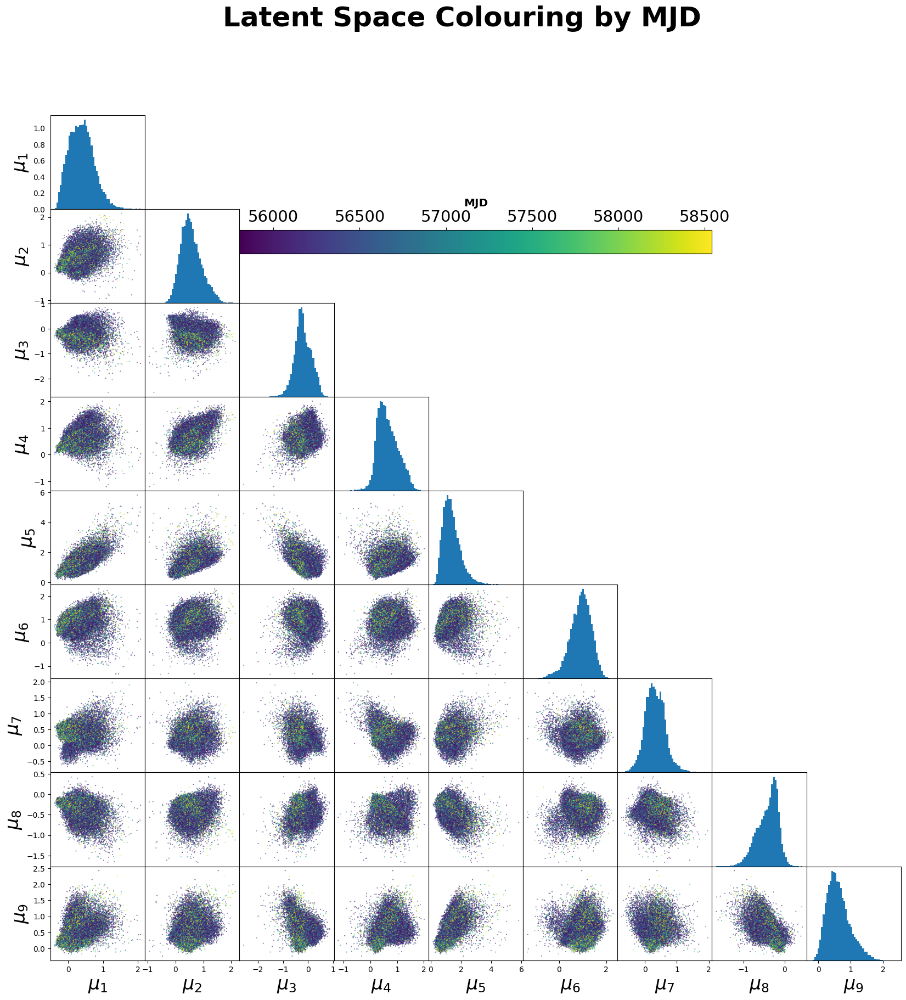

In [ ]:
generate_corner_plot(MJD_values, "MJD", clip_min=None, clip_max=None)

In [ ]:
RA_values = extract_dr16q_v4_vals(1)
DEC_values = extract_dr16q_v4_vals(2)

In [ ]:
#generate_hist(RA_values, "RA", array_mask=None, mode='lin', use_log_scale=True)


In [ ]:
#generate_hist(DEC_values, "DEC", array_mask=None, mode='lin', use_log_scale=True)


In [ ]:
#generate_dens(RA_values, "RA", array_mask=None, mode='lin', bins=100, lims=(None, None))


In [ ]:
#generate_dens(DEC_values, "DEC", array_mask=None, mode='lin', bins=100, lims=(None, None))


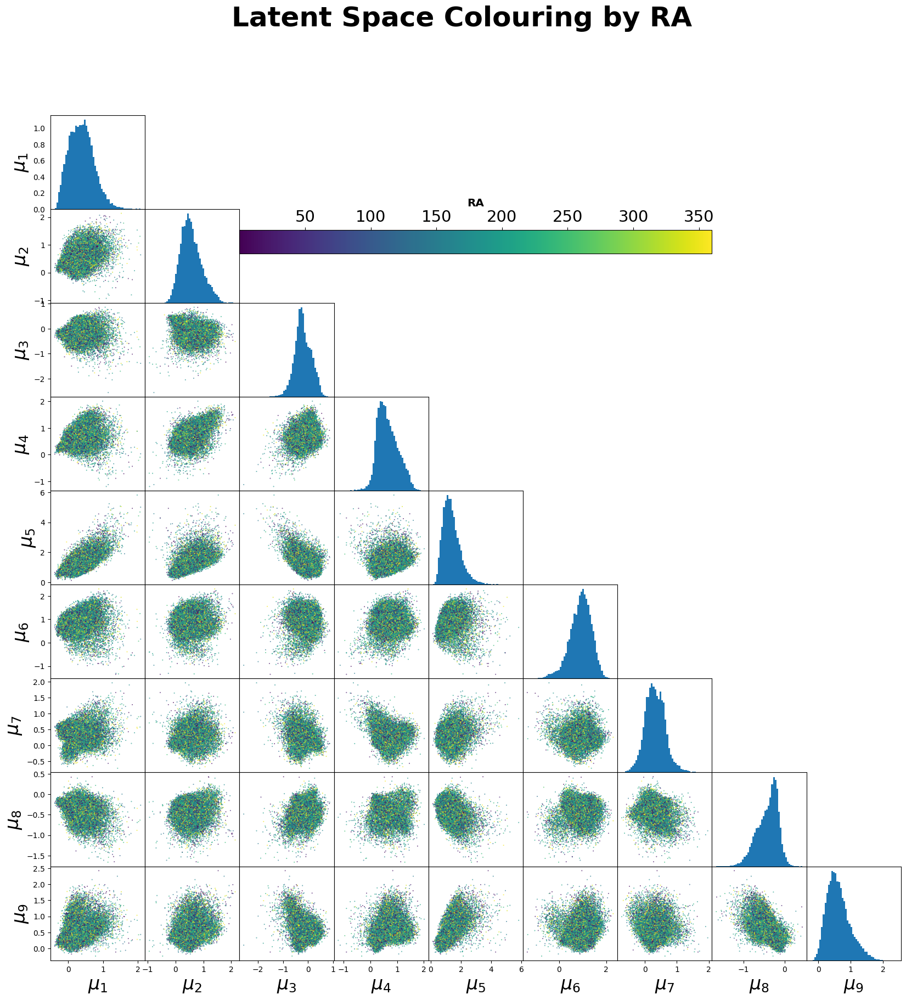

In [ ]:
generate_corner_plot(RA_values, "RA", clip_min=None, clip_max=None)

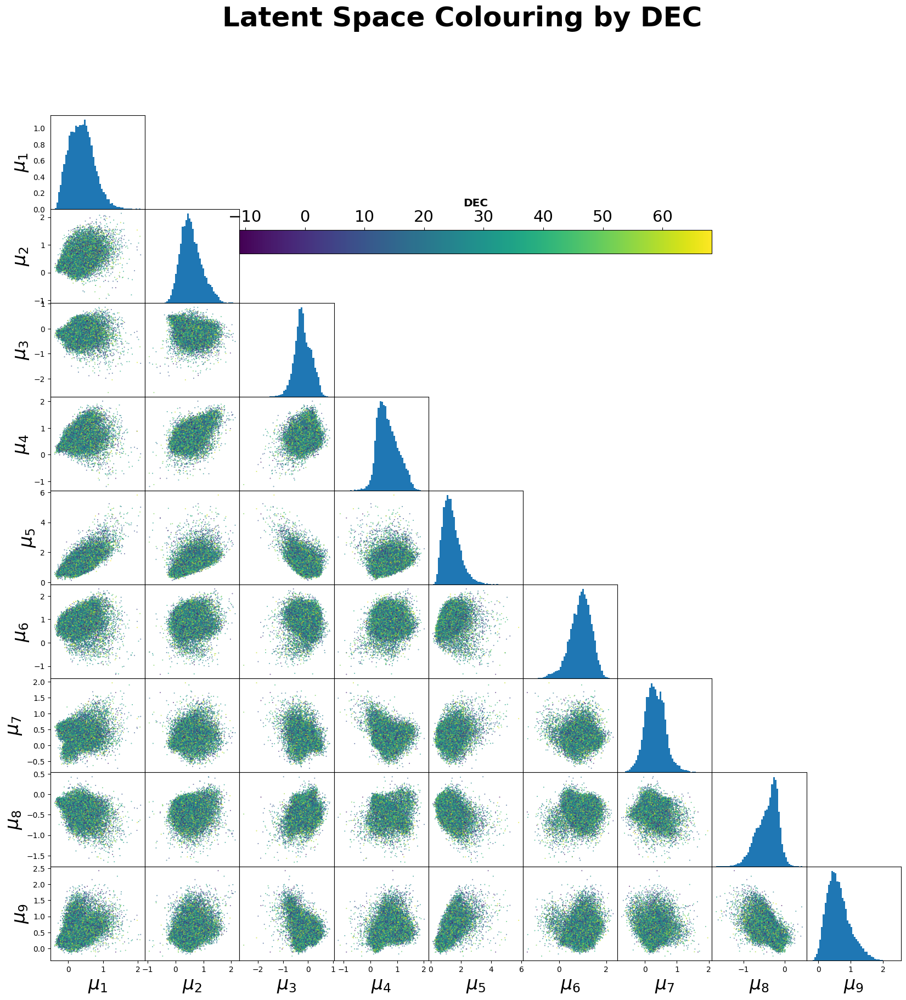

In [ ]:
generate_corner_plot(DEC_values, "DEC", clip_min=None, clip_max=None)

##### Absolute i-band magnitude, H0 = 67.6 km s-1 Mpc-1, ΩM = 0.31, ΩL = 0.69

In [ ]:
M_I_values = extract_dr16q_v4_vals(96)

In [ ]:
#generate_hist(M_I_values, "M_I", array_mask=None, mode='lin', use_log_scale=True)


In [ ]:
#generate_dens(M_I_values, "M_I", array_mask=None, mode='lin', bins=100, lims=(None, -24))


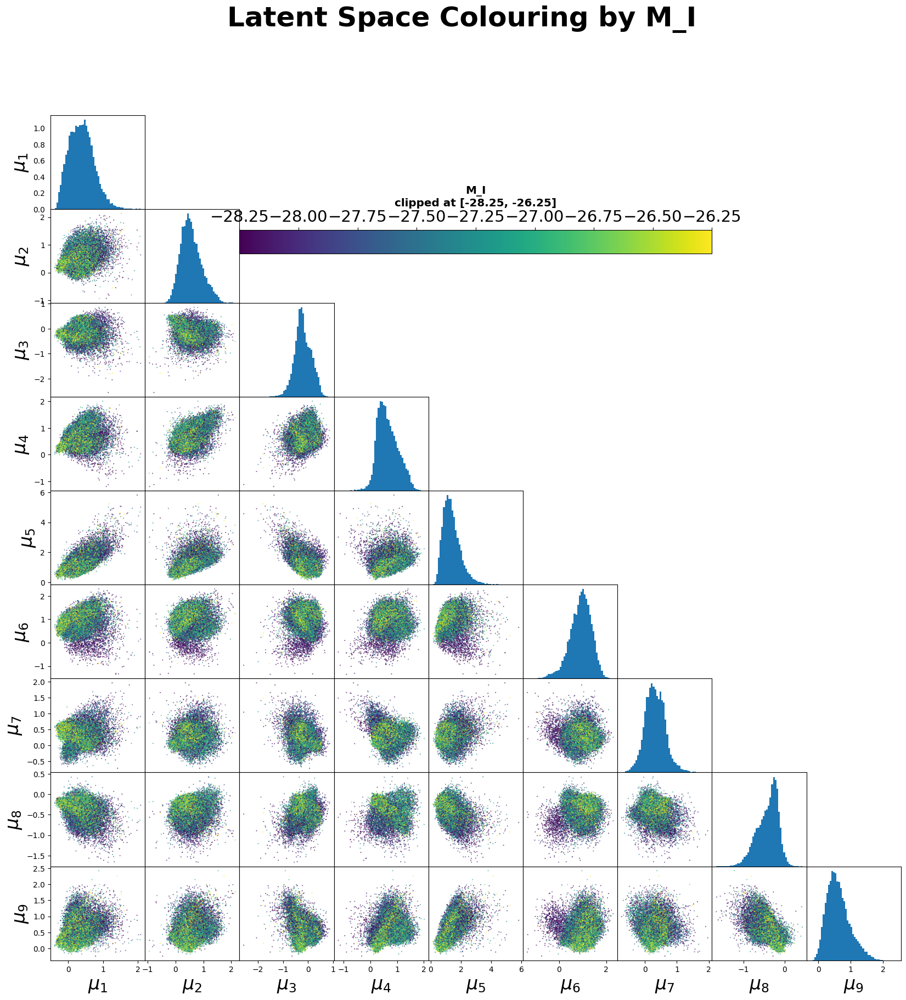

In [ ]:
generate_corner_plot(M_I_values, "M_I", clip_min=-28.25, clip_max=-26.25)

### Graph 4: sample spectra

In [ ]:
l_min = 3625
l_max = 9000

In [ ]:
# resolution of the unified grid array
# all spectra will become array of size (resolution, )
resolution = 3000

l_min_log = np.log(l_min)
l_max_log = np.log(l_max)
l_range_log = np.linspace(l_min_log, l_max_log, resolution)

In [ ]:
wavelengths = np.exp(l_range_log[::2])

6 Random spectra

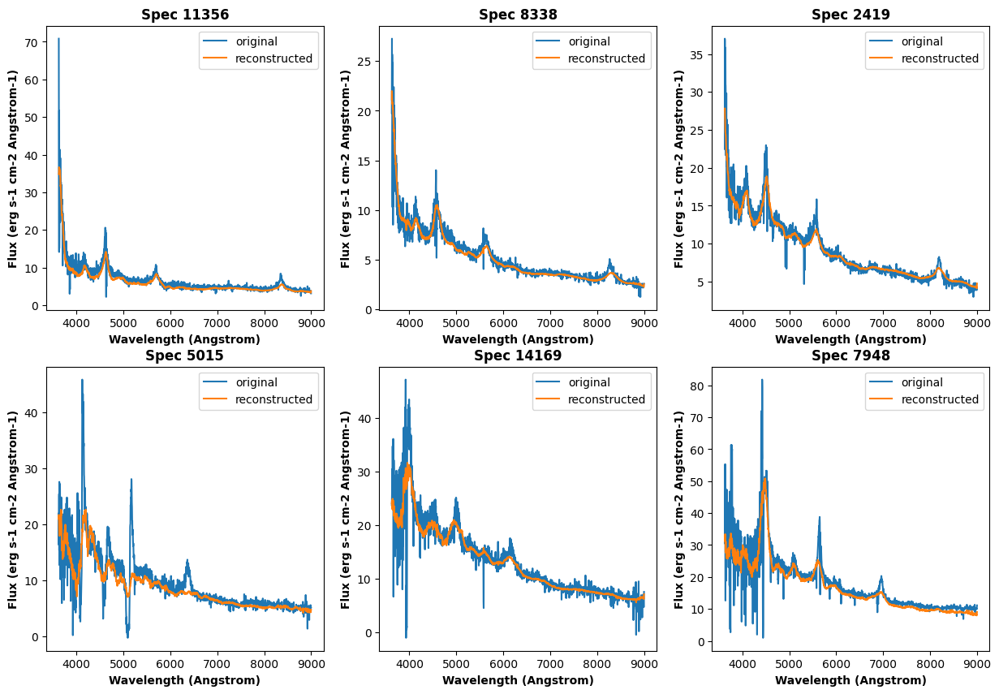

In [81]:
idxs = np.array([
    [11356, 8338, 2419],
    [5015, 14169, 7948],
])


fig, ax = plt.subplots(2, 3, figsize=(15,10))

for i in range(2):
    for j in range(3):
        ax[i, j].plot(wavelengths, trainspec[idxs[i, j], :]*norms[idxs[i,j]], label="original")
        ax[i, j].plot(wavelengths, recon_trainspec[2][idxs[i, j], :]*norms[idxs[i,j]], label="reconstructed")
        ax[i, j].set_title("Spec " + str(idxs[i, j]), fontweight='bold')
        ax[i, j].set_xlabel("Wavelength (Angstrom)", fontweight='bold')
        ax[i, j].set_ylabel("Flux (erg s-1 cm-2 Angstrom-1)", fontweight='bold')
        ax[i, j].legend()

#fig.suptitle("Sample Reconstructed Spectra")

plt.show()

Worst and best reconstruction spectra

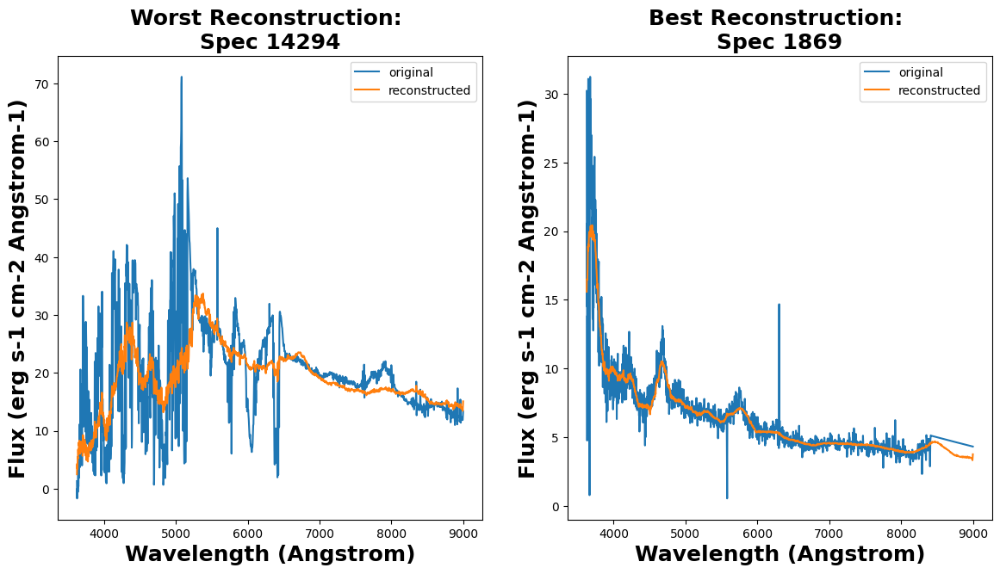

In [ ]:
idxs = np.array([
    np.argmax(model_recon_mse[2]), np.argmin(model_recon_mse[2])
])
extra_text = ["Worst Reconstruction: ", "Best Reconstruction: "]

fig, ax = plt.subplots(1, 2, figsize=(14,7))

for i in range(2):
    ax[i].plot(wavelengths, trainspec[idxs[i], :]*norms[idxs[i]], label="original")
    ax[i].plot(wavelengths, recon_trainspec[2][idxs[i], :]*norms[idxs[i]], label="reconstructed")
    ax[i].set_title(extra_text[i] + "\n" + "Spec " + str(idxs[i]), fontsize=18, fontweight='bold')
    ax[i].set_xlabel("Wavelength (Angstrom)", fontsize=18, fontweight='bold')
    ax[i].set_ylabel("Flux (erg s-1 cm-2 Angstrom-1)", fontsize=18, fontweight='bold')
    ax[i].legend()

#fig.suptitle("Best and Worst Reconstructed Spectra", fontsize=18, fontweight='bold')

plt.show()

### Graph 5: Corner plot for v4 fits columns

In [ ]:
v4_corner_data_array = [redshift_values, MJD_values, SN_MEDIAN_ALL_values, PLATESN2_values, RA_values, DEC_values, M_I_values, bal_prob_values, np.log10(model_recon_mse[2])]
v4_corner_data_array = np.array(v4_corner_data_array)
v4_corner_data_names = ['Z', 'MJD', 'SN_MEDIAN_ALL', 'PLATESN2', 'RA', 'DEC', 'M_I', 'BAL_PROB', r'$\log_{10}\chi^2$']

num_columns = v4_corner_data_array.shape[0]

In [ ]:
v4_corner_data_array.shape

(9, 16328)

In [ ]:
# shim away high values of M_I
v4_corner_data_array = v4_corner_data_array[:, (M_I_values <= -24)]

In [ ]:
v4_corner_data_array.shape

(9, 16293)

In [ ]:
num_bins = 50
use_log_scale = True

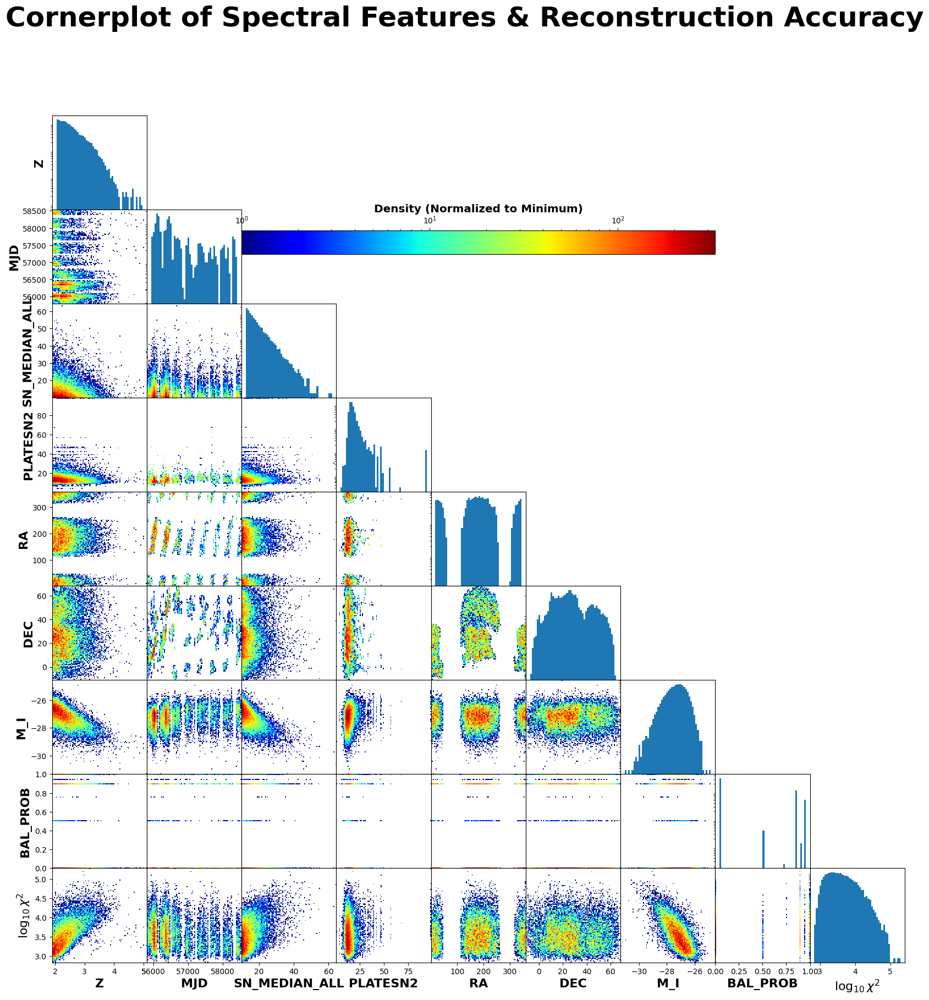

In [ ]:
fig, axes = plt.subplots(num_columns,num_columns, figsize=(20,20))
fig.subplots_adjust(hspace=0, wspace=0)

for i in range(num_columns):
    for j in range(num_columns):
        if i <= j:
            ps = axes[j, i]
            if i == 0: #and j != 0:
                ps.set_ylabel(v4_corner_data_names[j], fontsize=16, fontweight='bold')
            if j == num_columns - 1:
                ps.set_xlabel(v4_corner_data_names[i], fontsize=16, fontweight='bold')
            if i != 0:
                ps.set_yticks([])
            else:
                # ps.set_yticks([-1,0,1])
                pass

            if j != num_columns - 1:
                ps.set_xticks([])
            else:
                # ps.set_xticks([-1,0,1])
                pass

            if i < j:
                # 2d histogram of the important columns
                im = ps.hist2d(v4_corner_data_array[i, :], v4_corner_data_array[j, :], bins=(100, 100), cmap=plt.cm.jet, norm=colors.LogNorm())
            elif i == j:
                ps.hist(v4_corner_data_array[i, :], bins=num_bins, log=use_log_scale, density=True)
                ps.set_yticks([])
                ps.tick_params(left=False)

        else:
            ps = axes[j, i]
            ps.axis('off')

# print(im)

# plt.subplot(num_latents,num_latents,0+0*num_latents+1)
ps = axes[1, 2]
# ps.axis('on')
# fig.colorbar(im, label="log(z+1),\nclipped at " + str(redshift_log_clipmax), orientation="horizontal", ax=ps, shrink=0.9, location='top')
cbar = fig.colorbar(im[3], label="frequency", ax=ps, anchor=(0.0, 0.5), shrink=5.0, fraction=0.7, location='top')
cbar.set_label(label='Density (Normalized to Minimum)', size='x-large', weight='bold')
fig.suptitle("Cornerplot of Spectral Features & Reconstruction Accuracy", fontsize=36, fontweight='bold')
# plt.savefig('figures/cornerplot.png')
plt.show()